# Exercise 2

**Due date:** Long overdue 👀

**Learning goals:** calculate scene depth using block matching

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.color import rgb2gray
from skimage.transform import rescale
from tqdm.auto import trange

from middlebury_data_loader import MiddleburyStereoDataset
from utils import rectify, plot_dmaps

In [2]:
ds = MiddleburyStereoDataset()
scene = ds['Classroom1']['perfect']
image1, image2 = rgb2gray(scene.left), rgb2gray(scene.right)

## Task 1: Plot images

In [3]:
def plt_two_imgs(img1, img2, title=''):
    fig, axes = plt.subplots(ncols=2, figsize=(16, 6))
    axes[0].imshow(img1, cmap='gray')
    axes[1].imshow(img2, cmap='gray')
    fig.suptitle(title)
    plt.show()

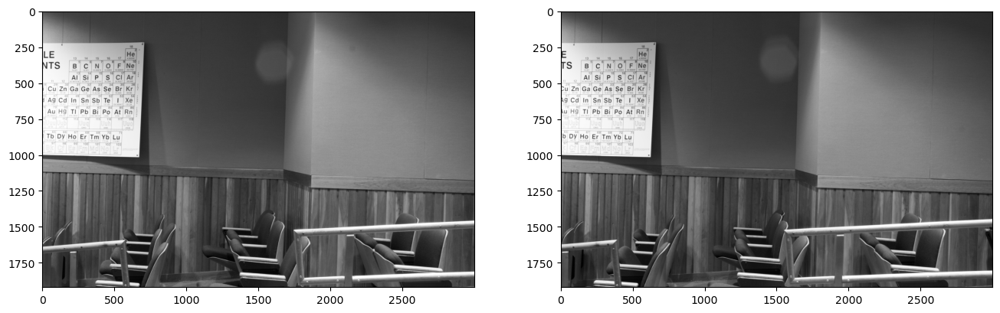

In [4]:
plt_two_imgs(image1, image2)

start kp extraction.
extraction successful. image1: 5642 kps | image2: 5531 kps.
start matching.
matching successful. matched 3170 kps.
start outlier removal.
outlier removal successful. dropped: 157 kps | remaining: 3013 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


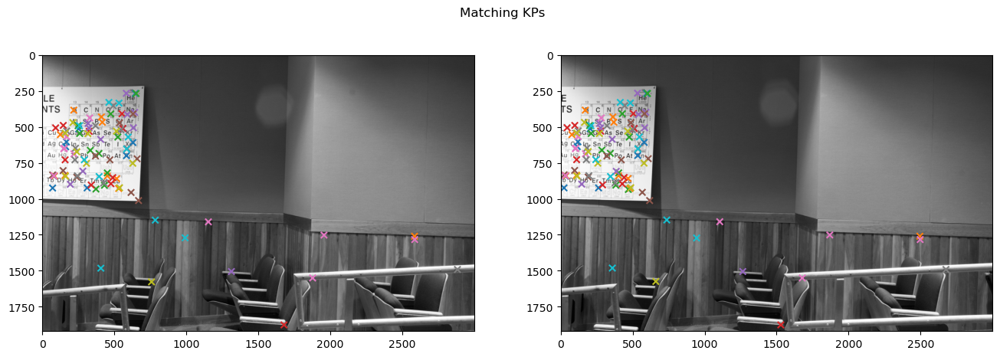

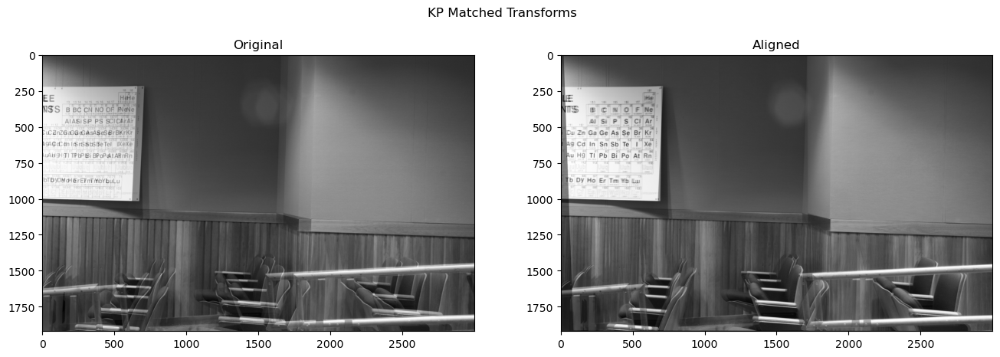

calculate fundamental matrix F.
fundamental matrix calculated.
calculate homography matrices H1, H2.
homography matrices calculated.
apply homography matrices.
display rectified images, with epipolar lines of select keypoints...


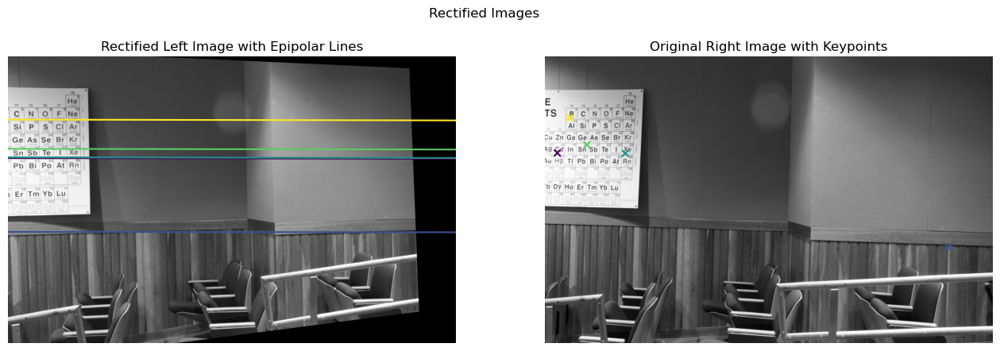

In [5]:
result = rectify(image1, image2, display=True)
image1_rect, image2_rect = result['image1_rect'], result['image2_rect']

## Task 2: calculate Disparity

### Task 2.1: Scanline

#### Implementation

In [ ]:
from numpy.lib.stride_tricks import sliding_window_view


def SAD(left, right): return np.abs(left - right).sum(axis=(2, 3))


def SSD(left, right): return ((left - right) ** 2).sum(axis=(2, 3))


def NCC(left, right):
    l = left - left.mean(axis=(2, 3), keepdims=True)
    r = right - right.mean(axis=(2, 3), keepdims=True)
    num = (l * r).sum(axis=(2, 3))
    denom = ((l * l).sum(axis=(2, 3)) * (r * r).sum(axis=(2, 3))) ** .5
    return -num / denom


def scanline(image1, image2, *, cost_f=SAD, block_size=15):
    H, W = image1.shape
    bs = block_size
    dmax = W // 10

    pad = block_size // 2
    image1 = np.pad(image1, ((pad, pad), (pad, pad)), mode='constant')
    image2 = np.pad(image2, ((pad, pad), (pad, pad)), mode='constant')

    left_patches = sliding_window_view(image1, (bs, bs))
    right_patches = sliding_window_view(image2, (bs, bs))

    cost_vol = np.full((H, W, dmax), np.inf)

    for d in trange(dmax):
        rp = right_patches[:, d:, :, :]
        lp = left_patches[:, :-d or None, :, :]
        cost_vol[:, :-d or None, d] = cost_f(lp, rp)

    return cost_vol.argmin(axis=2)

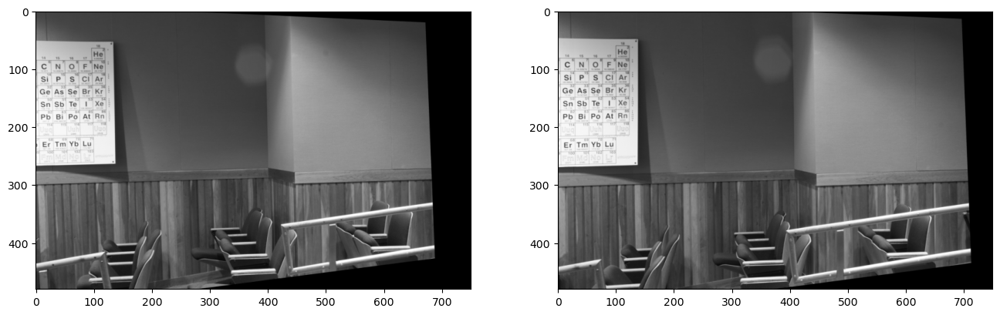

In [7]:
scale = 1 / 4
image1_rect_scal, image2_rect_scal = rescale(image1_rect, scale), rescale(image2_rect, scale)
plt_two_imgs(image1_rect_scal, image2_rect_scal)

In [8]:
disp_sad = scanline(image1_rect_scal, image2_rect_scal)
disp_ssd = scanline(image1_rect_scal, image2_rect_scal, cost_f=SSD)
disp_ncc = scanline(image1_rect_scal, image2_rect_scal, cost_f=NCC)

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

/var/folders/vn/srnd3r9j0nbbr96c4j87qypr0000gn/T/ipykernel_41335/2852878747.py:15: RuntimeWarning: invalid value encountered in divide
  return -num / denom


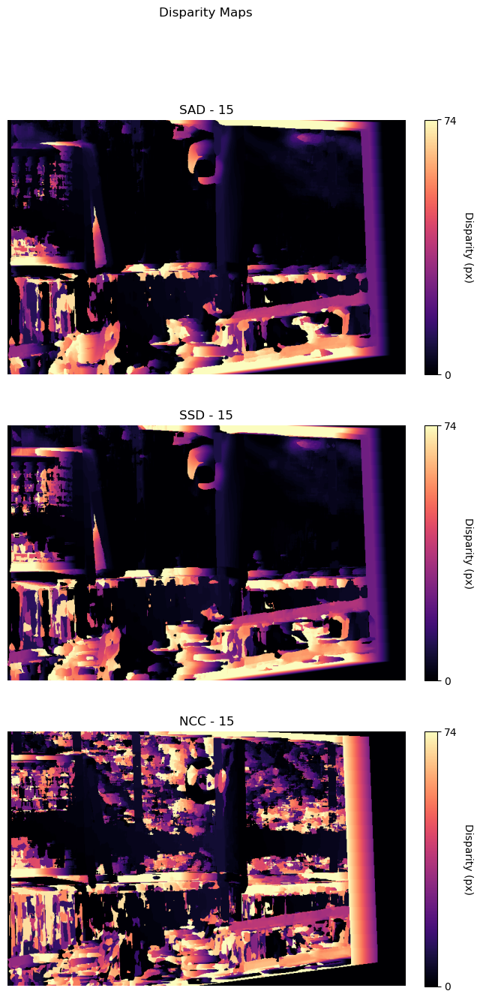

In [9]:
plot_dmaps({'SAD': {15: disp_sad}, 'SSD': {15: disp_ssd}, 'NCC': {15: disp_ncc}})

- SAD and SSD visually equal, NCC unclear.
- You can clearly see that the chairs, which moved the most/are the closest, are also the brightest, while the wall is much darker.
This could be due to the nature of the wall having a uniform color.
- The circle of light was recognized by its outer rims.

Let's try different block sizes. Since SAD and SSD look more or less the same, and NCC is very confusing, we'll just focus on SAD.

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

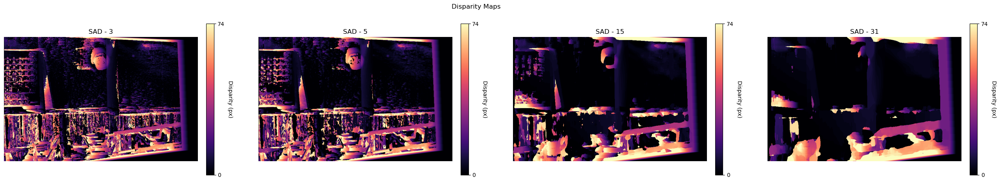

In [10]:
block_sizes = [3, 5, 15, 31]
scan_bs = lambda bs: scanline(image1_rect_scal, image2_rect_scal, block_size=bs)

plot_dmaps({'SAD': {bs: scan_bs(bs) for bs in block_sizes}})

- Large block sizes
    - Lose details
    - Focussed on a few components
    - Much slower
- Small blocks
    - Noisy
    - Better depicts movement of the whole image

Now, let's create utility functions and test different images.

#### Experiments

In [11]:
from utils import calculate_dmaps

In [12]:
def scanline_pipeline(scene_name):
    scene = ds[scene_name]['perfect']
    image1, image2 = rgb2gray(scene.left), rgb2gray(scene.right)
    _ = calculate_dmaps(image1, image2, display=True)

start kp extraction.
extraction successful. image1: 1266 kps | image2: 1075 kps.
start matching.
matching successful. matched 509 kps.
start outlier removal.
outlier removal successful. dropped: 12 kps | remaining: 497 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


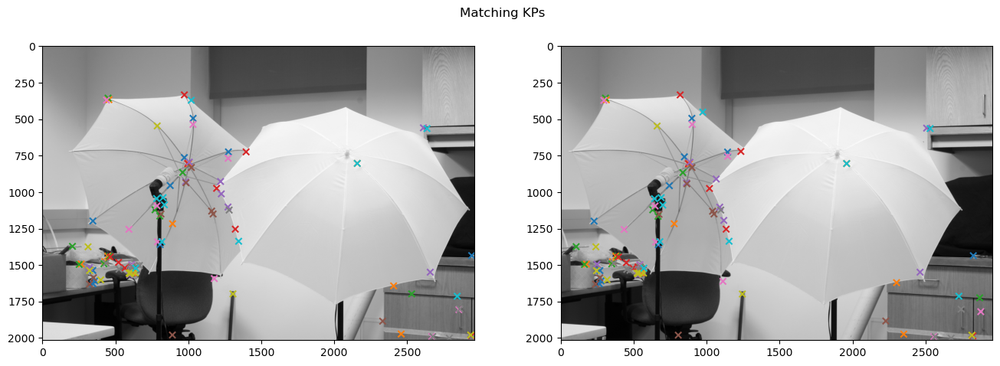

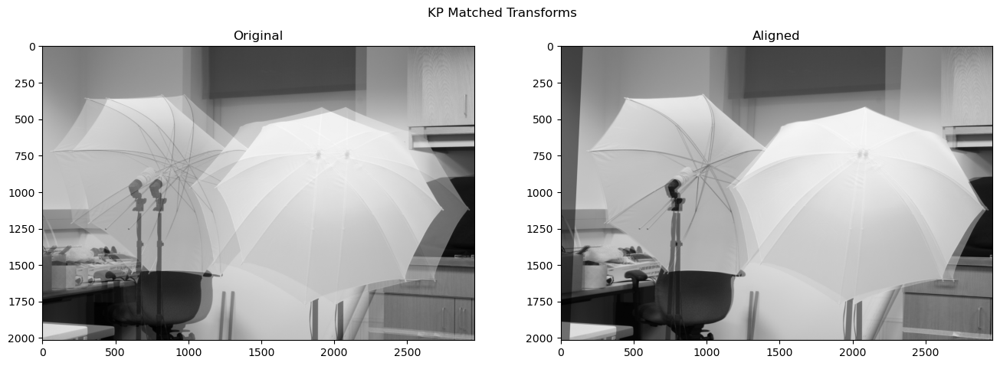

calculate fundamental matrix F.
fundamental matrix calculated.
calculate homography matrices H1, H2.
homography matrices calculated.
apply homography matrices.
display rectified images, with epipolar lines of select keypoints...


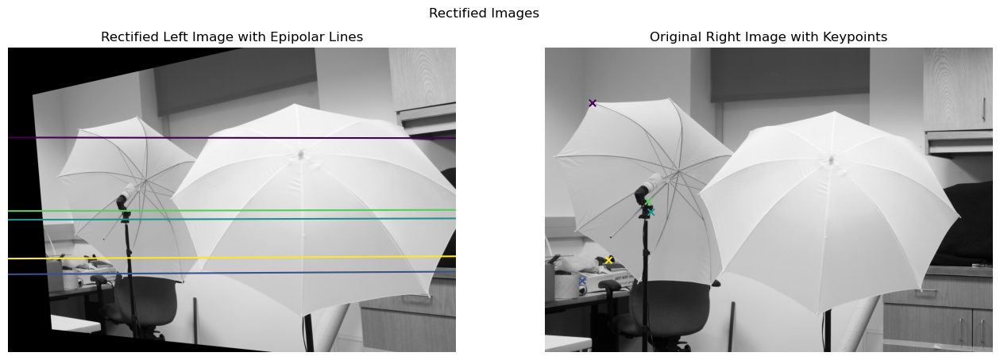

calculate SAD disparity maps.


SAD - 5:   0%|          | 0/73 [00:00<?, ?it/s]

SAD - 9:   0%|          | 0/73 [00:00<?, ?it/s]

SAD - 15:   0%|          | 0/73 [00:00<?, ?it/s]

SAD disparity maps calculated.
display disparity maps...


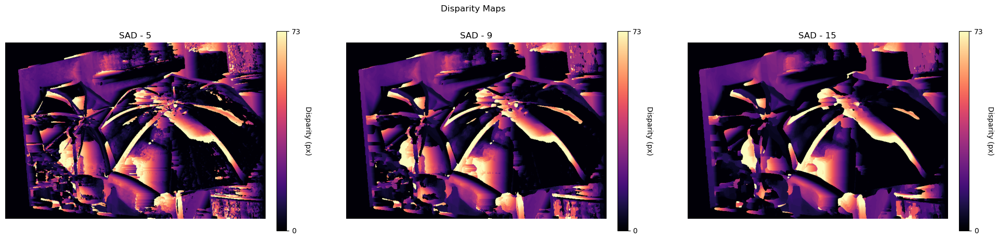

In [13]:
scanline_pipeline('Umbrella')

start kp extraction.
extraction successful. image1: 13464 kps | image2: 20473 kps.
too many kps. reducing to 10000 each.
start matching.
matching successful. matched 1433 kps.
start outlier removal.
outlier removal successful. dropped: 118 kps | remaining: 1315 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


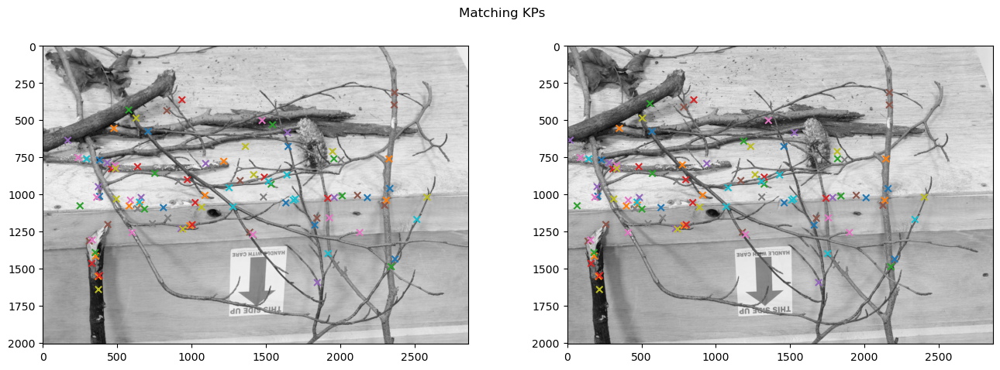

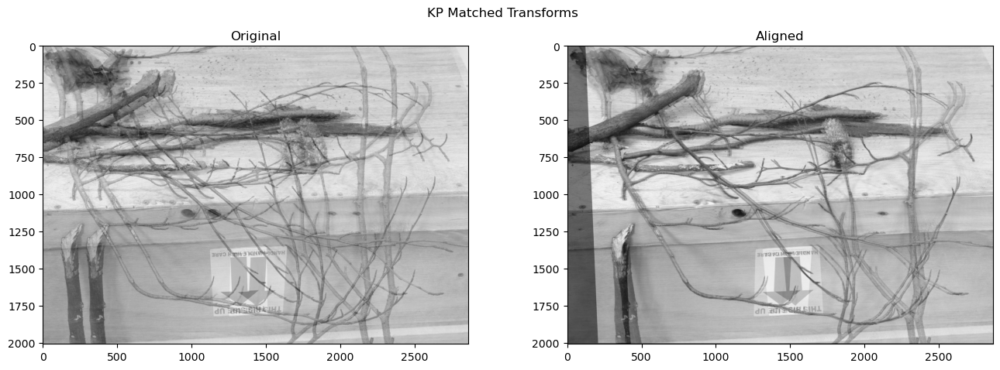

calculate fundamental matrix F.
fundamental matrix calculated.
calculate homography matrices H1, H2.
homography matrices calculated.
apply homography matrices.
display rectified images, with epipolar lines of select keypoints...


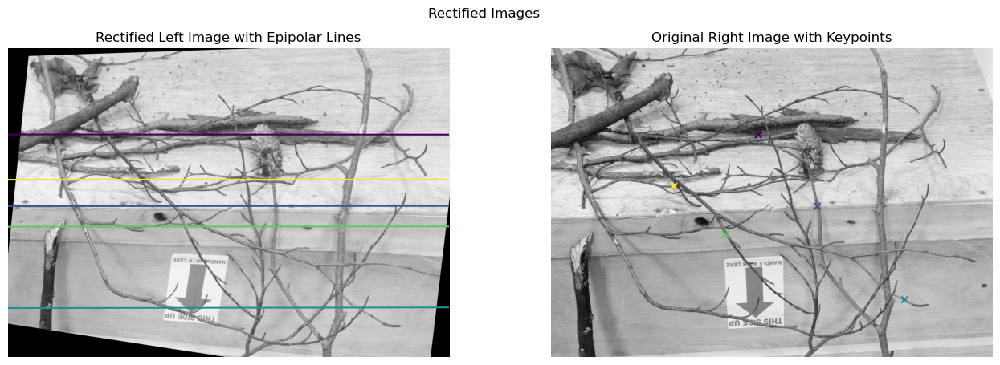

calculate SAD disparity maps.


SAD - 5:   0%|          | 0/70 [00:00<?, ?it/s]

SAD - 9:   0%|          | 0/70 [00:00<?, ?it/s]

SAD - 15:   0%|          | 0/70 [00:00<?, ?it/s]

SAD disparity maps calculated.
display disparity maps...


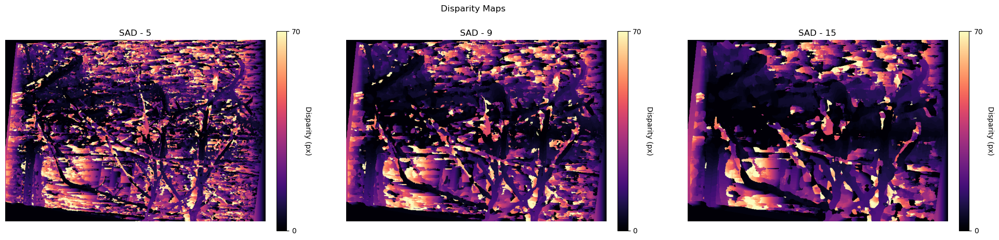

In [14]:
scanline_pipeline('Sticks')

start kp extraction.
extraction successful. image1: 999 kps | image2: 972 kps.
start matching.
matching successful. matched 442 kps.
start outlier removal.
outlier removal successful. dropped: 5 kps | remaining: 437 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


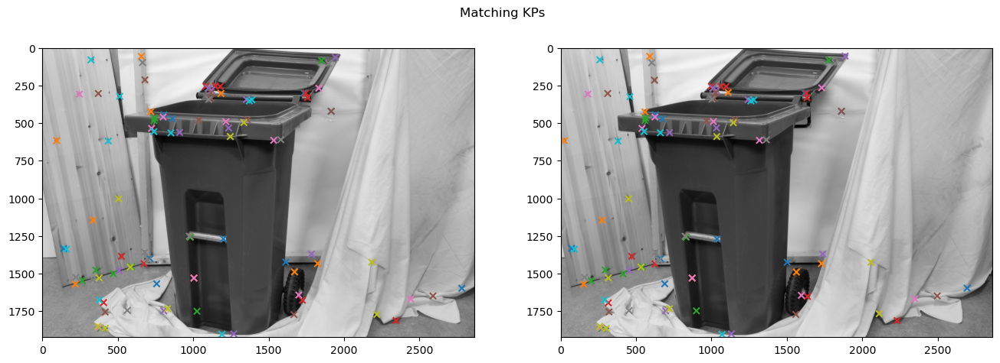

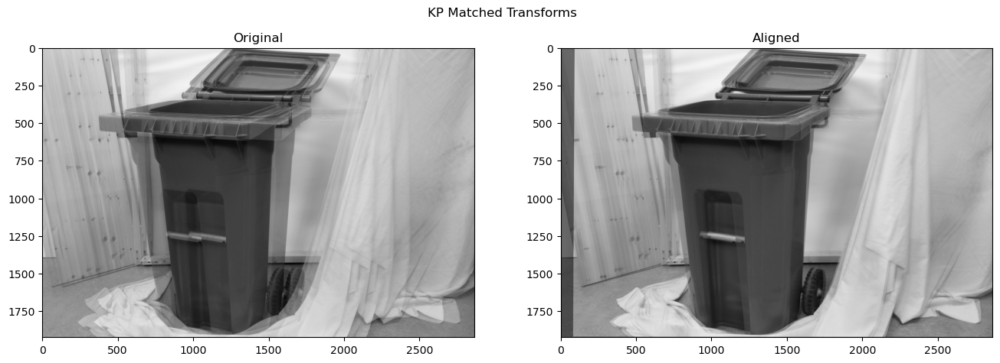

calculate fundamental matrix F.
fundamental matrix calculated.
calculate homography matrices H1, H2.
homography matrices calculated.
apply homography matrices.
display rectified images, with epipolar lines of select keypoints...


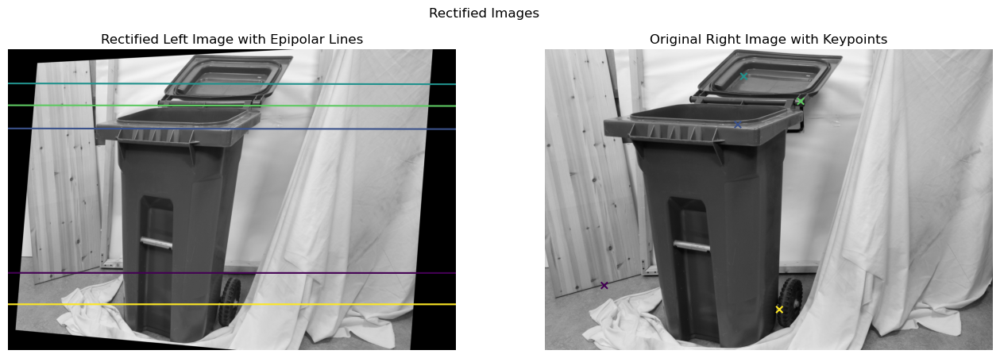

calculate SAD disparity maps.


SAD - 5:   0%|          | 0/70 [00:00<?, ?it/s]

SAD - 9:   0%|          | 0/70 [00:00<?, ?it/s]

SAD - 15:   0%|          | 0/70 [00:00<?, ?it/s]

SAD disparity maps calculated.
display disparity maps...


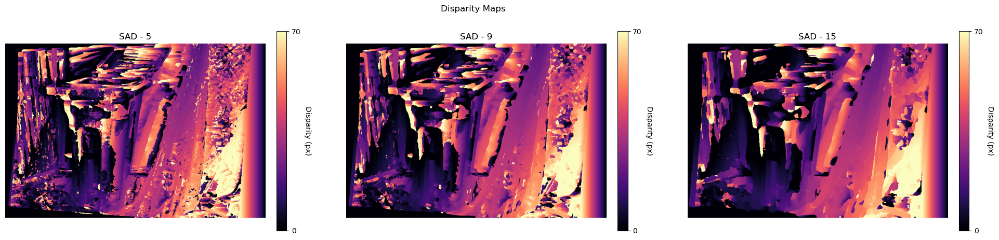

In [15]:
scanline_pipeline('Recycle')

### Task 2.2: Cross-Checking

### Task 2.3: Resolution of Ambiguous Matches